In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
import torch
import faiss

import seaborn as sns
import matplotlib.pyplot as plt

import scSLAT
from scSLAT.model import run_SLAT_multi,load_anndatas, Cal_Spatial_Net, run_SLAT, scanpy_workflow, spatial_match
from scSLAT.viz import match_3D_multi, build_3D, hist, Sankey, match_3D_celltype
from scSLAT.metrics import region_statistics

In [3]:
sc.set_figure_params(dpi=150, dpi_save=150)

In [4]:
adata1 = sc.read_h5ad('../../data/xenium/breast/data1_split.h5ad')
adata2 = sc.read_h5ad('../../data/visium/breast/data3_split.h5ad')

In [9]:
embd0 = np.loadtxt('./stagate_emb0.csv', delimiter=',')
embd1 = np.loadtxt('./stagate_emb1.csv', delimiter=',')
embd0 = torch.from_numpy(embd0)
embd1 = torch.from_numpy(embd1)

In [10]:
best, index, distance = spatial_match([embd1, embd0], reorder=False)
matching = np.array([range(index.shape[0]), best])

In [11]:
adata1_df = pd.DataFrame({'index':range(embd0.shape[0]),
                          'x': adata1.obsm['spatial'][:,0],
                          'y': adata1.obsm['spatial'][:,1],
                          'leiden':adata1.obs['leiden']})
adata2_df = pd.DataFrame({'index':range(embd1.shape[0]),
                          'x': adata2.obsm['spatial'][:,0],
                          'y': adata2.obsm['spatial'][:,1],
                          'leiden':adata2.obs['leiden']})
matching = np.array([range(index.shape[0]), best])
best_match = distance[:,0]
region_statistics(best_match,start=0.5,number_of_interval=10)

0.500~0.550      3315          3.294%
0.550~0.600      4378          4.350%
0.600~0.650      5235          5.202%
0.650~0.700      7068          7.023%
0.700~0.750     10586         10.518%
0.750~0.800     17805         17.691%
0.800~0.850     25840         25.675%
0.850~0.900     17991         17.876%
0.900~0.950      2840          2.822%
0.950~1.000        30          0.030%


/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py:242: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.celltypes = set(self.dataset_A[meta].append(self.dataset_B[meta]))


dataset1: 11 cell types; dataset2: 11 cell types; 
                    Total :11 celltypes; Overlap: 11 cell types 
                    Not overlap :[[]]
Subsample 300 cell pairs from 100642


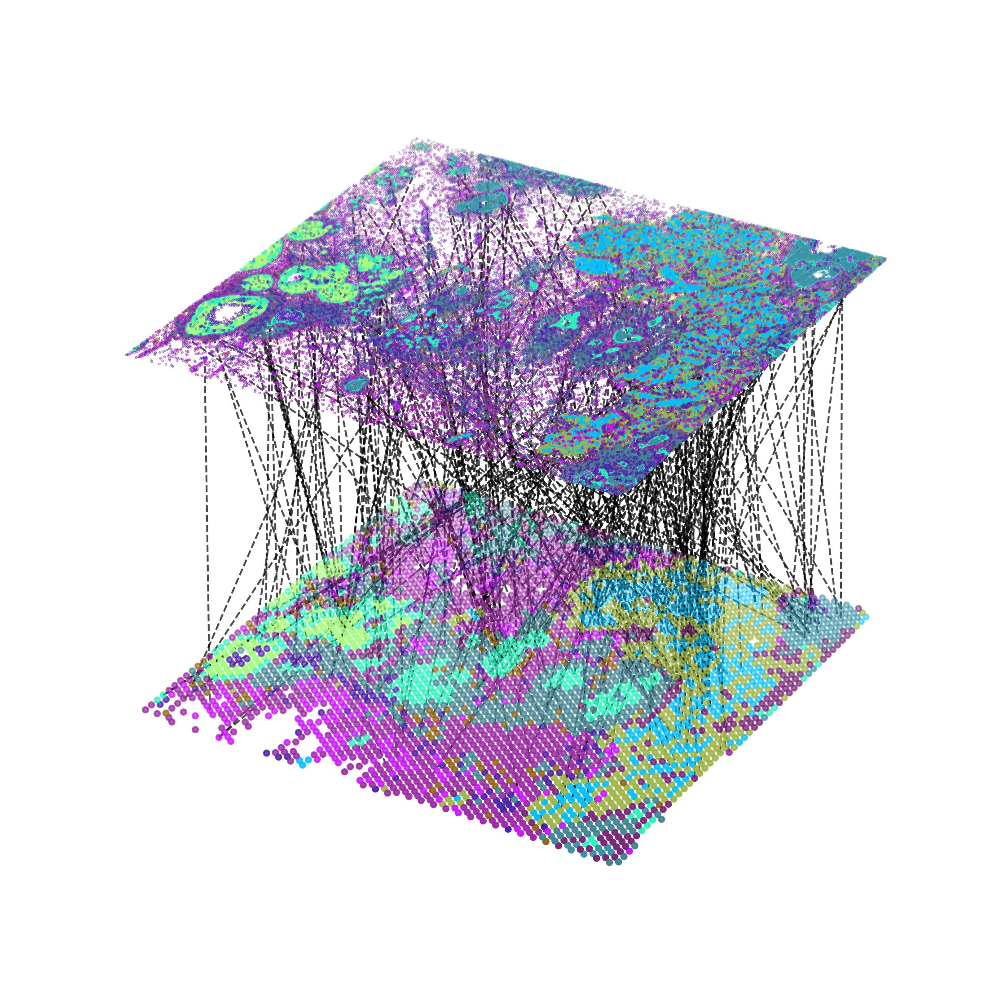

In [12]:
multi_align = match_3D_multi(adata2_df, adata1_df, matching, meta='leiden',
                            scale_coordinate=True, subsample_size=300)

multi_align.draw_3D(size=[13, 9.5], line_width=1 ,point_size=[8,0.1], line_color='black', show_error=False, hide_axis=True)

# Subset View

In [13]:
TP_Xenium_coord = pd.read_csv('../../data/xenium/breast/TP_coordinates.csv')
ref_coord = adata1.obsm['spatial'].astype('float32').copy()

In [14]:
query_coord = TP_Xenium_coord.iloc[:,1:].to_numpy() * -1
query_coord = query_coord.astype('float32').copy()

In [15]:
index = faiss.IndexFlatL2(2) 
index.add(ref_coord)   
distance, order = index.search(query_coord, 2)

In [16]:
TP_Xenium_barcode = adata1.obs_names[order[:,0]]
TP_Xenium_index = list(set(order[:,0]))

In [17]:
TP_matching = matching[:,TP_Xenium_index]
unique_elements, frequency = np.unique(TP_matching[1,:], return_counts=True)
sorted_indexes = np.argsort(frequency)[::-1]
sorted_by_freq = unique_elements[sorted_indexes]

/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py:242: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.celltypes = set(self.dataset_A[meta].append(self.dataset_B[meta]))


dataset1: 11 cell types; dataset2: 11 cell types; 
                    Total :11 celltypes; Overlap: 11 cell types 
                    Not overlap :[[]]
Subsample 20 cell pairs from 94


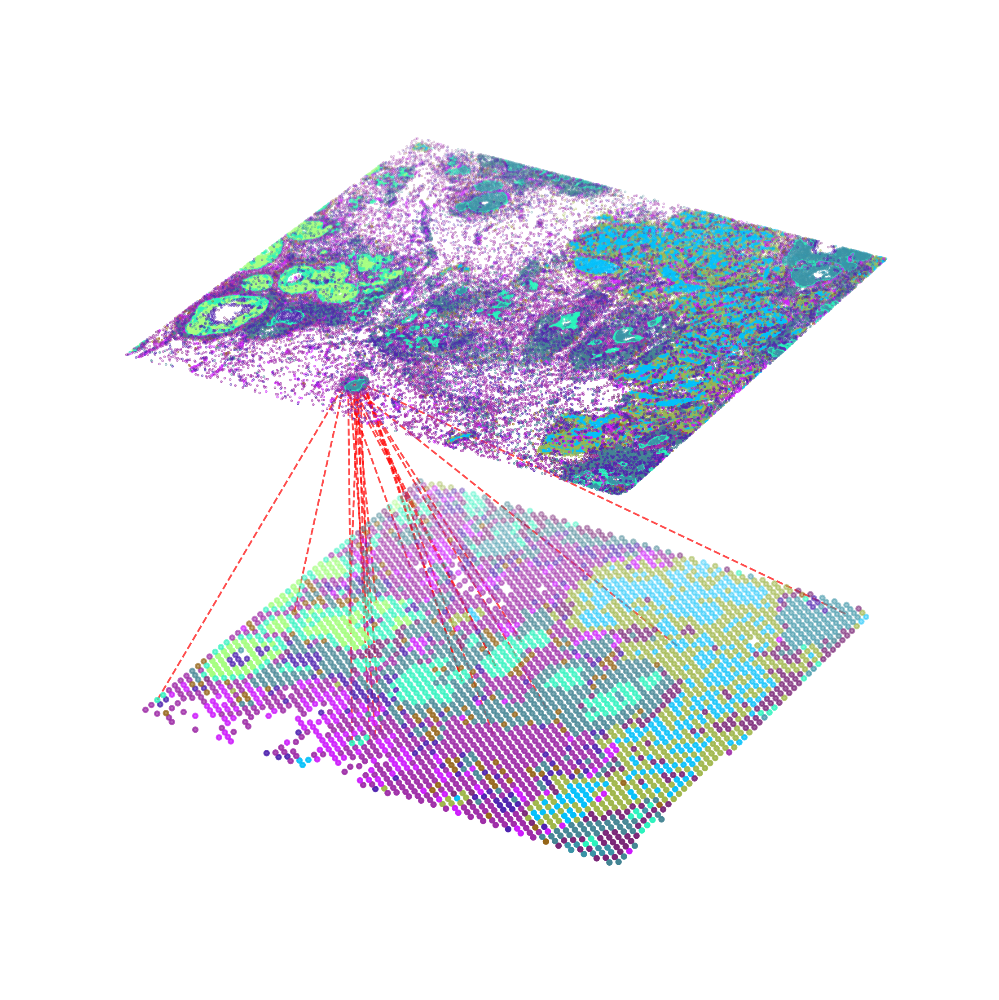

In [19]:
multi_align = match_3D_multi(adata2_df, adata1_df, matching,meta='leiden',
                            scale_coordinate=True, subsample_size=20, subset=list(set(order[:,0])))

multi_align.draw_3D(size=[13, 9.5], line_width=1 ,point_size=[6,0.1], show_error=False, hide_axis=True, line_color='red')